In [ ]:
#install dependencies
!pip install pyyaml==5.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 31.1 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=b5913c00ec9bddd737ebd13d602d2a78da6a6dcd271232062f3de28864e28205
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
# change pytorch version
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |█████████████                   | 834.1 MB 1.4 MB/s eta 0:14:51tcmalloc: large alloc 1147494400 bytes == 0x399ae000 @  0x7f1006535615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |████████████████▌               | 1055.7 MB 1.4 MB/s eta 0:12:04tcmalloc: large alloc 1434370048 bytes == 0x7e004000 @  0x7f1006535615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |█████

In [ ]:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.9/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.9/index.html
     |████████████████████████████████| 6.9 MB 589 kB/s 
     |████████████████████████████████| 79 kB 7.5 MB/s 
     |████████████████████████████████| 50 kB 7.7 MB/s 
     |████████████████████████████████| 151 kB 61.0 MB/s 
     |████████████████████████████████| 130 kB 69.5 MB/s 
     |████████████████████████████████| 843 kB 52.1 MB/s 
     |████████████████████████████████| 117 kB 67.9 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220512-py3-none-any.whl size=61288 sha256=cb71e6e58dbe07f556ae8b328e39e586e858586c17b3969fe60ee8b812ee594e
  Stored in directory: /root/.cache/pip/wheels/68/20/f9/a11a0dd63f4c13678b2a5ec488e48078756505c7777b75b29e
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144575 sha256=f20870f05c37738796f

In [ ]:
import detectron2

In [ ]:
#utilities required from detectron2
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog   #register our data set with detectron2

In [ ]:
import os
import sys
import numpy as np
import json, cv2, random
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

In [ ]:
import requests

##**Custom** **dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
assert torch.__version__.startswith("1.9") 
import torchvision
import cv2

In [ ]:
import os
import numpy as np
import json
import random
import matplotlib.pyplot as plt
%matplotlib inline

from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog

##Existing model

In [ ]:
# path_of_the_directory="/content/drive/MyDrive/Detectron2/train/"

In [ ]:
# for i in os.listdir(path_of_the_directory):
#    if i.endswith('.png'):
#      print(i)
#      im = cv2.imread(i)
#      outputs = predictor1(im)
#      print(outputs["instances"].pred_classes)
#      print(outputs["instances"].pred_boxes)

#      for data in outputs["instances"].pred_classes:
#        number = data.item()
#        print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[number])

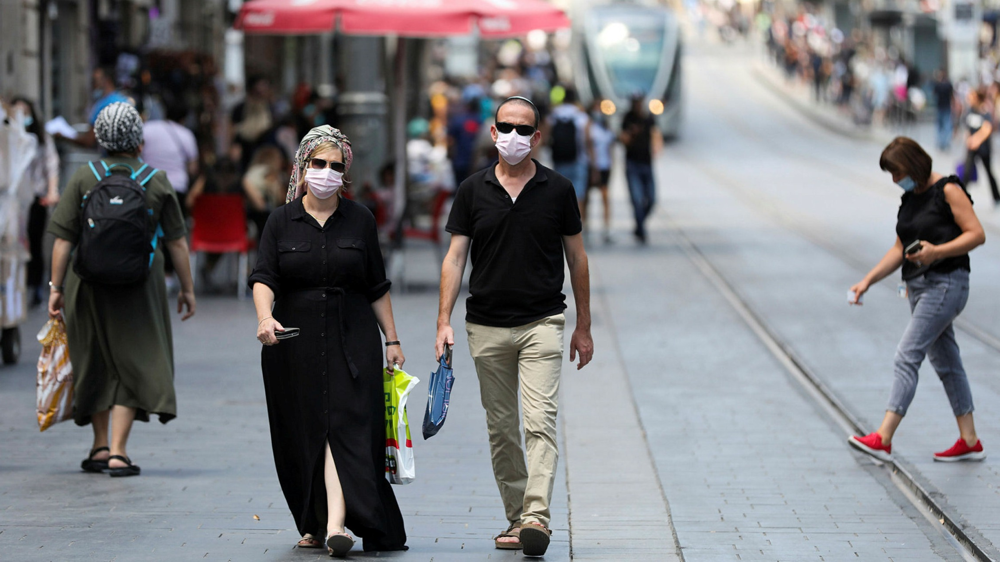

In [ ]:
!wget https://d1e00ek4ebabms.cloudfront.net/production/4dc4f137-a812-4d4b-afc3-4813ea0997c4.jpg -q -O input.jpg
im = cv2.imread("./input.jpg")
cv2_imshow(im)

In [ ]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor1 = DefaultPredictor(cfg)

model_final_f10217.pkl: 178MB [00:24, 7.38MB/s]                           


In [ ]:
outputs = predictor1(im)
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

for data in outputs["instances"].pred_classes:
  number = data.item()
  print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[number])

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


tensor([ 0,  0,  0,  0,  0, 24, 56, 26,  0, 24, 67,  0,  0,  0,  0, 67,  0,  0,
         0,  0,  2,  0,  0,  0,  0,  0, 38,  0,  0], device='cuda:0')
Boxes(tensor([[ 976.1254,  213.9537, 1342.9448, 1268.1443],
        [ 552.3791,  292.0211,  932.5425, 1266.9437],
        [1906.6370,  302.5172, 2230.4832, 1049.6681],
        [ 102.4863,  216.5065,  436.1030, 1087.9243],
        [1389.3593,  215.8475, 1500.3818,  556.3584],
        [ 161.3344,  363.9372,  366.1485,  652.4579],
        [ 424.8452,  438.8944,  567.2438,  673.2292],
        [  77.9073,  704.4649,  170.3839,  985.0357],
        [1317.8038,  235.4209, 1397.6238,  552.0368],
        [1243.9908,  260.7484, 1309.0634,  366.3850],
        [ 619.5377,  740.9898,  674.8146,  768.3170],
        [1230.0037,  202.3790, 1336.4847,  477.8367],
        [2163.5000,  188.1802, 2257.0000,  465.7763],
        [ 513.5201,  167.6884,  626.4193,  379.2991],
        [2099.3921,  150.1229, 2155.5623,  336.0228],
        [2039.6707,  542.1712, 208

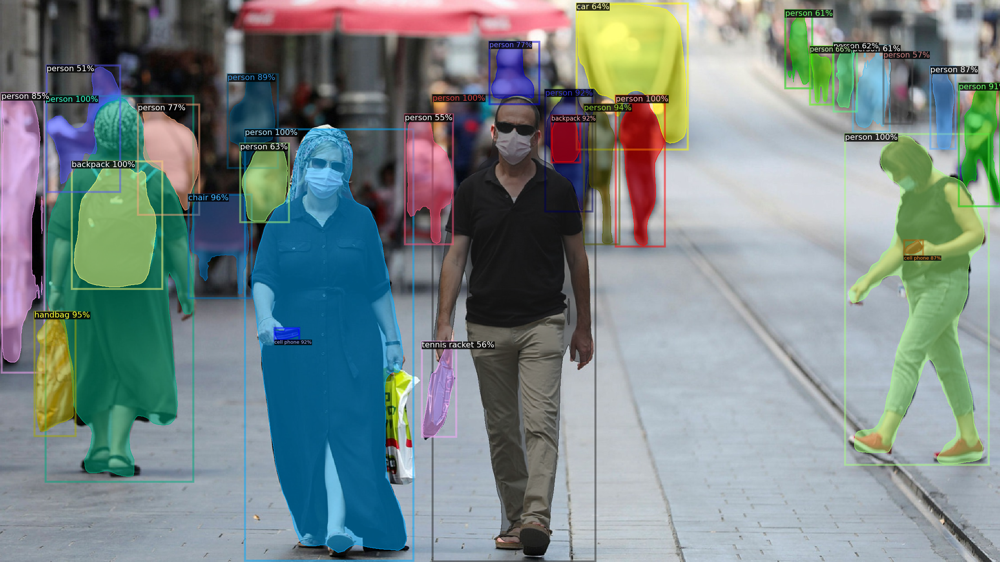

In [ ]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

##**Try custom model**

In [ ]:

def get_data_dicts(directory, classes):
    dataset_dicts = []
    for filename in [file for file in os.listdir(directory) if file.endswith('.json')]:
        json_file = os.path.join(directory, filename)
        with open(json_file) as f:
            img_anns = json.load(f)

        record = {}
        
        filename = os.path.join(directory, img_anns["imagePath"])
        height, width =cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["height"] = height
        record["width"] = width
      
        annos = img_anns["shapes"]
        objs = []
        for anno in annos:
            px = [a[0] for a in anno['points']] # x coord
            py = [a[1] for a in anno['points']] # y-coord

            # poly = [(x, y) for x, y in zip(px, py)] # poly for segmentation
            # poly = [p for x in poly for p in x]

            x1,y1,x2,y2 = px[0],py[0],px[1],py[1]

            points = (x1, y1), (x2, y2)
            x1, x2 = sorted([x1, x2])
            y1, y2 = sorted([y1, y2])
            points = [x1, y1, x2, y1, x2, y2, x1, y2]
            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [points],
                "category_id": classes.index(anno['label']),
                "iscrowd": 0
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [ ]:
classes = ['vaccine', 'mask']

data_path = '/content/drive/MyDrive/Detectron2/'

for d in ["train", "test"]:
    DatasetCatalog.register(
        "category_" + d, 
        lambda d=d: get_data_dicts(data_path+d, classes)
    )
    MetadataCatalog.get("category_" + d).set(thing_classes=classes)

microcontroller_metadata = MetadataCatalog.get("category_train")

In [ ]:
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import ColorMode, Visualizer

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("category_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1000
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2

In [ ]:
cfg.OUTPUT_DIR = "outputs"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)

[06/15 05:32:35 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (2, 256, 1, 1) in

In [ ]:
trainer.train()

[06/15 05:33:13 d2.engine.train_loop]: Starting training from iteration 0
[06/15 05:33:25 d2.utils.events]:  eta: 0:08:32  iter: 19  total_loss: 1.803  loss_cls: 0.9511  loss_box_reg: 0.1021  loss_mask: 0.6878  loss_rpn_cls: 0.0165  loss_rpn_loc: 0.01351  time: 0.5081  data_time: 0.0965  lr: 4.9953e-06  max_mem: 3014M
[06/15 05:33:35 d2.utils.events]:  eta: 0:07:41  iter: 39  total_loss: 1.675  loss_cls: 0.8505  loss_box_reg: 0.09796  loss_mask: 0.6825  loss_rpn_cls: 0.02437  loss_rpn_loc: 0.0104  time: 0.4893  data_time: 0.0098  lr: 9.9902e-06  max_mem: 3014M
[06/15 05:33:45 d2.utils.events]:  eta: 0:07:47  iter: 59  total_loss: 1.462  loss_cls: 0.61  loss_box_reg: 0.1144  loss_mask: 0.6632  loss_rpn_cls: 0.01086  loss_rpn_loc: 0.01375  time: 0.5023  data_time: 0.0298  lr: 1.4985e-05  max_mem: 3014M
[06/15 05:33:56 d2.utils.events]:  eta: 0:07:51  iter: 79  total_loss: 1.239  loss_cls: 0.4416  loss_box_reg: 0.1286  loss_mask: 0.6416  loss_rpn_cls: 0.009724  loss_rpn_loc: 0.01118  time

KeyboardInterrupt: ignored

##Improved training time

In [ ]:
# we have saved weights in google drive. 

cfg.OUTPUT_DIR = '/content/drive/MyDrive/Detectron2/outputs'

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
predictor = DefaultPredictor(cfg)

In [ ]:
!wget https://www.sharp.com/health-news/images/What-changes-after-full-FDA-approval-of-COVID-vaccines-HN2698-iStock-1318517696-Sized.jpg -q -O input4.jpg
im = cv2.imread("./input4.jpg")

outputs = predictor(im)
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

for data in outputs["instances"].pred_classes:
  number = data.item()
  print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[number])

tensor([1], device='cuda:0')
Boxes(tensor([[393.5042, 121.4655, 577.3335, 253.6535]], device='cuda:0'))
mask


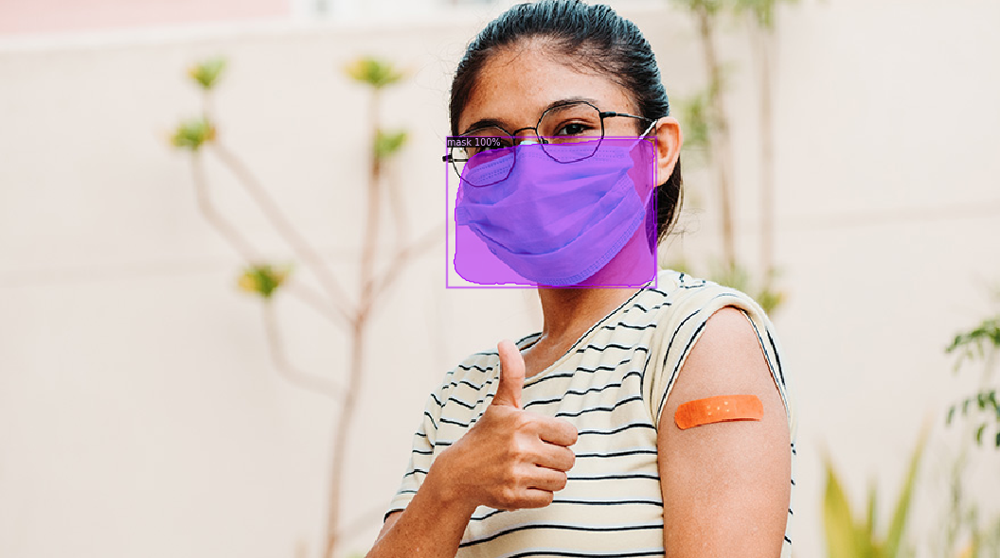

In [ ]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
print(cfg.OUTPUT_DIR)

/content/drive/MyDrive/Detectron2/outputs


tensor([1, 0, 1, 0], device='cuda:0')
Boxes(tensor([[124.9891, 126.1011, 265.3954, 259.2764],
        [330.0833, 222.0072, 365.9548, 318.9010],
        [498.1340,   5.6492, 646.3397, 157.3425],
        [323.6548, 196.4639, 383.7394, 313.1253]], device='cuda:0'))
mask
vaccine
mask
vaccine


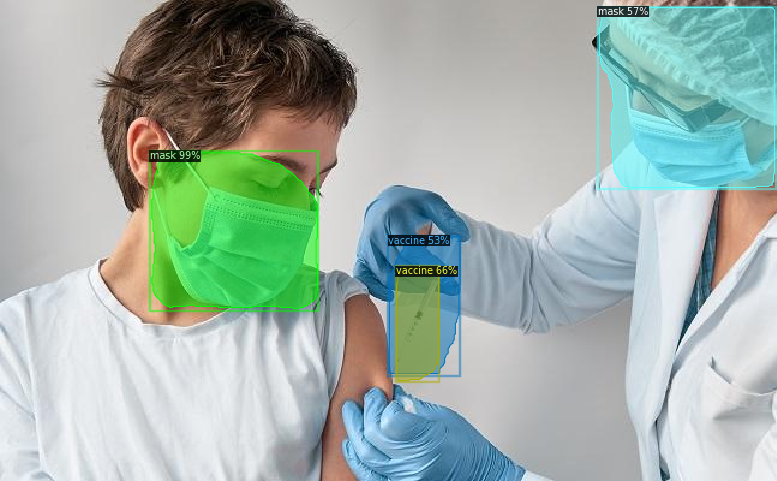

In [ ]:
!wget https://d18mqtxkrsjgmh.cloudfront.net/public/styles/header_image/public/2021-06/vaccine.jpg?itok=LS8-xHGA -q -O input5.jpg
im = cv2.imread("./input5.jpg")

outputs = predictor(im)
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

for data in outputs["instances"].pred_classes:
  number = data.item()
  print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[number])


v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

tensor([1, 1], device='cuda:0')
Boxes(tensor([[802.3904, 361.8715, 902.7673, 427.1279],
        [ 85.2832, 104.3701, 153.8222, 153.2814]], device='cuda:0'))
mask
mask


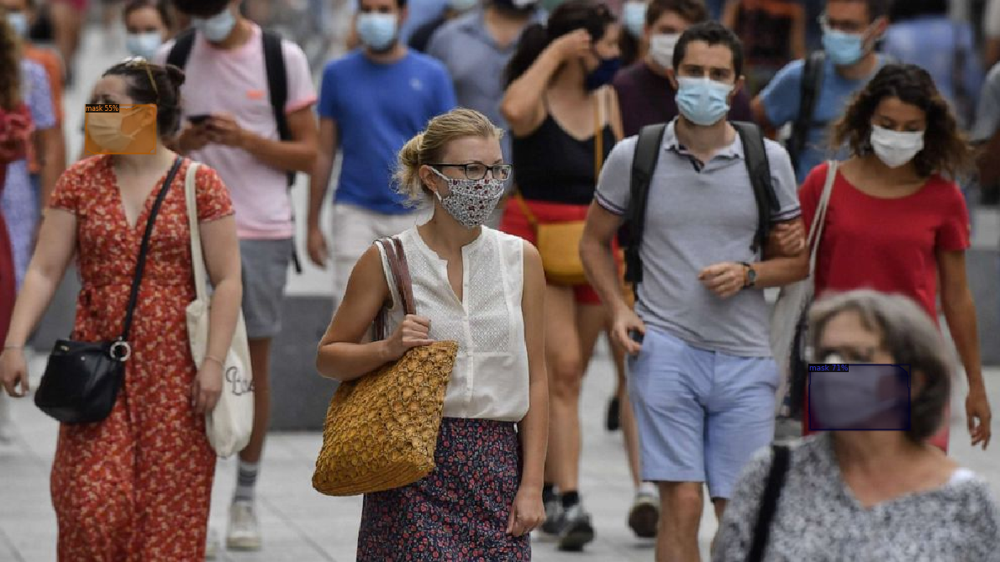

In [ ]:
!wget https://s.abcnews.com/images/Health/people-wearing-masks-lyon-france-getty-200824_hpMain_20200824-090515_2_16x9_992.jpg -q -O input6.jpg
im = cv2.imread("./input6.jpg")

outputs = predictor(im)
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

for data in outputs["instances"].pred_classes:
  number = data.item()
  print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[number])


v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

tensor([], device='cuda:0', dtype=torch.int64)
Boxes(tensor([], device='cuda:0', size=(0, 4)))


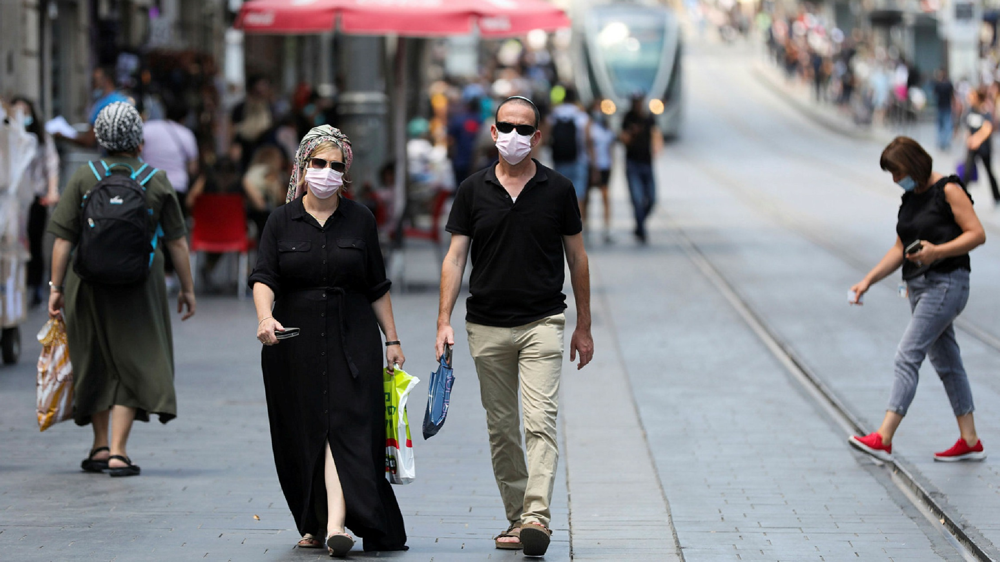

In [ ]:
!wget https://d1e00ek4ebabms.cloudfront.net/production/4dc4f137-a812-4d4b-afc3-4813ea0997c4.jpg -q -O input7.jpg
im = cv2.imread("./input7.jpg")

outputs = predictor(im)
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

for data in outputs["instances"].pred_classes:
  number = data.item()
  print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[number])


v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

tensor([1, 0, 1], device='cuda:0')
Boxes(tensor([[388.6956, 550.8278, 474.3931, 779.0773],
        [394.0717, 569.7019, 478.2408, 779.9453],
        [123.2185, 168.9765, 231.0773, 229.6126]], device='cuda:0'))
mask
vaccine
mask


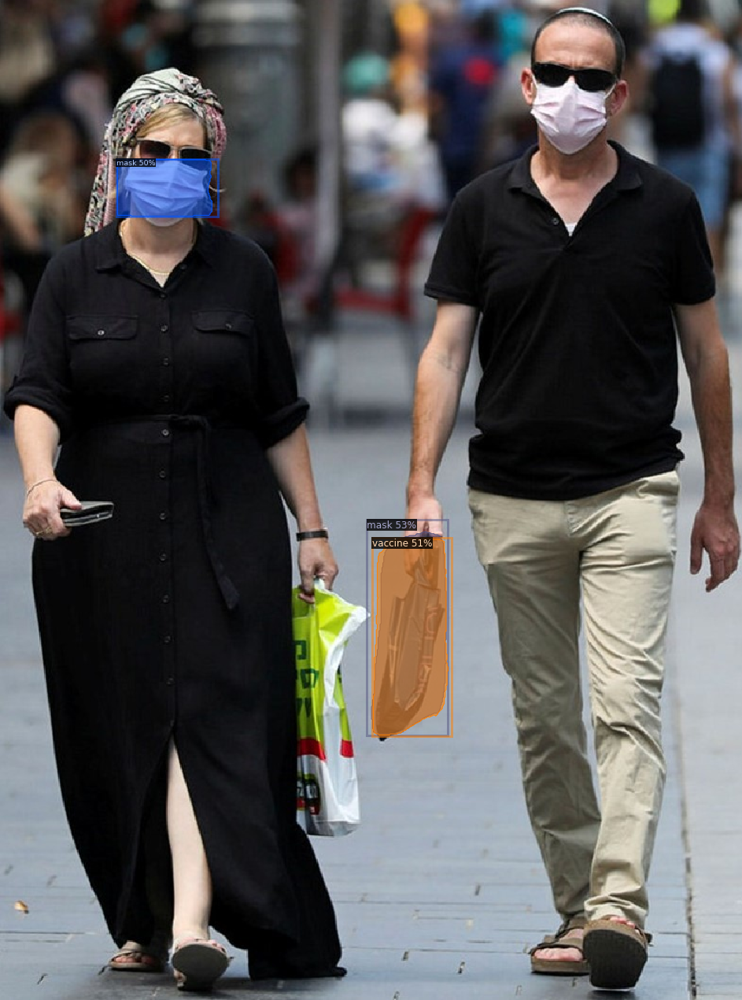

In [ ]:
im=cv2.imread('/content/drive/MyDrive/Detectron2/mask_crop.jpg')
outputs = predictor(im)
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

for data in outputs["instances"].pred_classes:
  number = data.item()
  print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[number])


v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

tensor([1, 0], device='cuda:0')
Boxes(tensor([[107.2575, 244.7060, 294.9697, 391.5938],
        [486.3973, 301.7656, 648.8777, 392.4727]], device='cuda:0'))
mask
vaccine


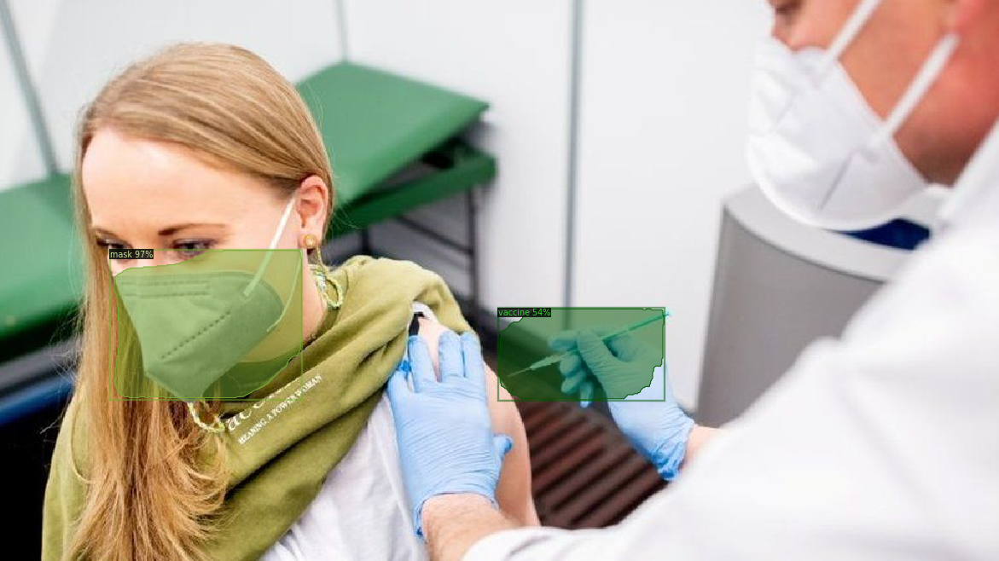

In [ ]:
!wget https://ichef.bbci.co.uk/news/976/cpsprodpb/172DC/production/_117604949_64b7aa72-9a31-4d4d-ba07-a65c615683be.jpg -q -O input8.jpg
im = cv2.imread("./input8.jpg")

outputs = predictor(im)
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

for data in outputs["instances"].pred_classes:
  number = data.item()
  print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[number])


v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])